<a href="https://colab.research.google.com/github/ahmedelalaoui142/Forecasting_financial_time_series/blob/main/Tenaga.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = yf.download('5347.KL',start="1900-01-01",end='2024-09-01', interval="1d")

[*********************100%***********************]  1 of 1 completed


In [ ]:
df

Price,Adj Close,Close,High,Low,Open,Volume
Ticker,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL
Date,,,,,,
2006-05-09,3.863339,7.04,7.08,7.00,7.04,4418
2006-05-10,3.907241,7.12,7.16,7.04,7.04,12820
2006-05-11,3.885289,7.08,7.12,7.04,7.12,6263
2006-05-12,3.885289,7.08,7.08,7.08,7.08,0
2006-05-15,3.885289,7.08,7.08,6.96,7.04,3625
...,...,...,...,...,...,...
2024-08-26,13.686756,13.92,14.00,13.76,13.76,5585600
2024-08-27,13.686756,13.92,14.00,13.84,13.84,4614600


Visualisation

In [ ]:
a = df['Close']

In [ ]:
a.describe()

Ticker,5347.KL
count,4525.000000
mean,10.039042
std,3.148831
min,4.560000
25%,6.950000
50%,9.620000
75%,13.120000
max,16.240000


In [ ]:
from plotly import express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio

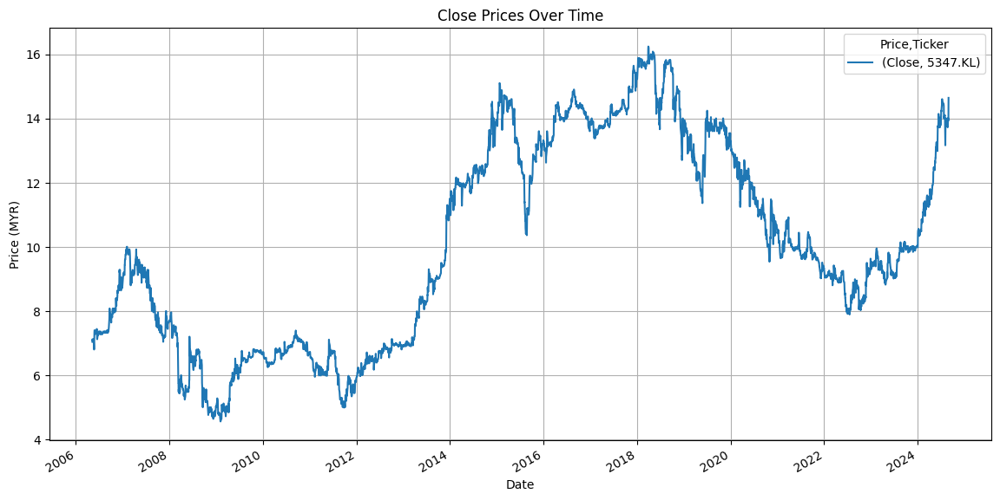

In [ ]:
import matplotlib.pyplot as plt

# Assuming df is already defined with the provided structure
# Plotting Open, High, Low, Close prices

columns_to_plot = ['Close']
df[columns_to_plot].plot(figsize=(14, 7), title='Close Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Price (MYR)')
plt.grid(True)
plt.show()


In [ ]:
from pathlib import Path
from warnings import simplefilter

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

simplefilter("ignore")

# Set Matplotlib defaults

plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'


# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

In [ ]:
df['Close']

Ticker,5347.KL
Date,
2006-05-09,7.04
2006-05-10,7.12
2006-05-11,7.08
2006-05-12,7.08
2006-05-15,7.08
...,...
2024-08-26,13.92
2024-08-27,13.92
2024-08-28,14.00


<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

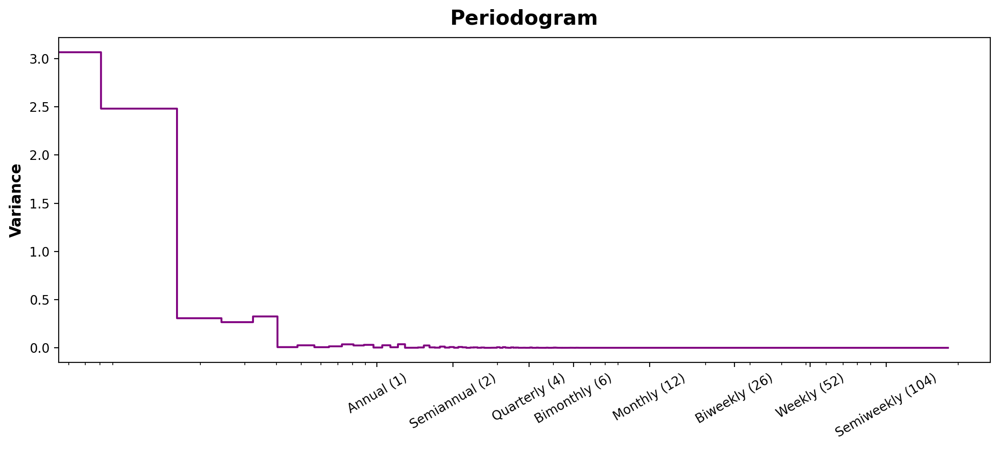

In [ ]:
# Ensure 'Close' is a pandas Series or 1D array
close_values = df['Close'].values.flatten()  # Convert to 1D numpy array

# Plot the periodogram
plot_periodogram(close_values)


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df['Close'],model='additive',period =365, extrapolate_trend= 365)

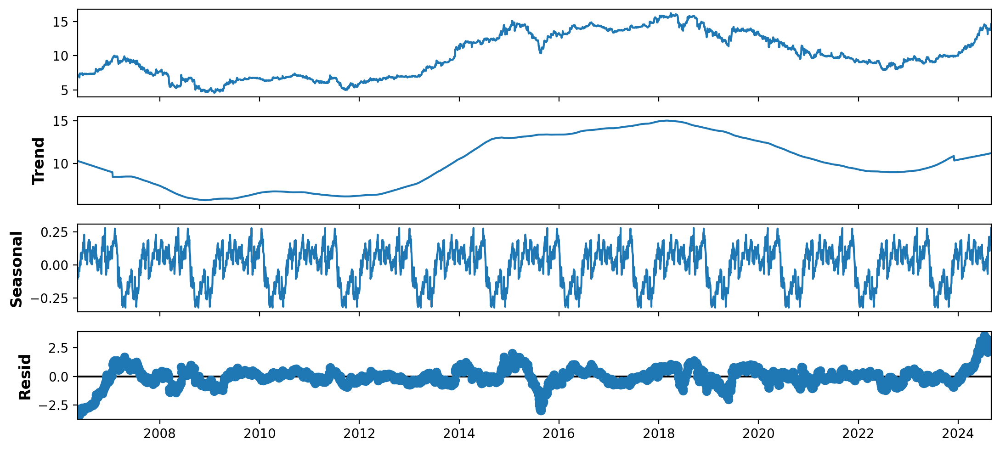

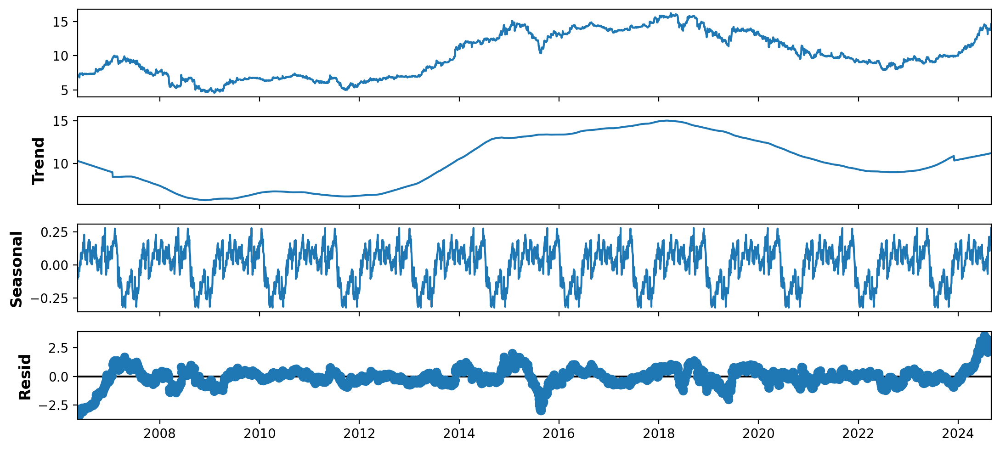

In [ ]:
result.plot()

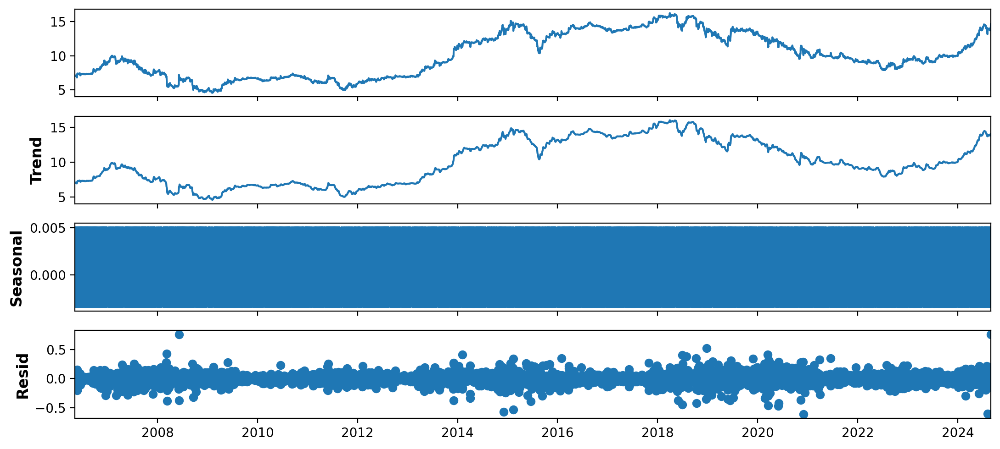

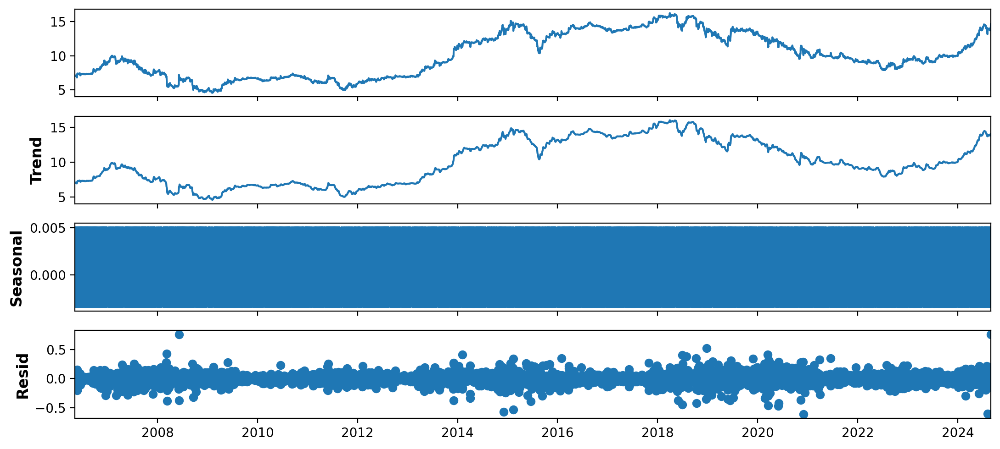

In [ ]:
result = seasonal_decompose(df.Close, model='additive',period=5, extrapolate_trend = 5)
result.plot()

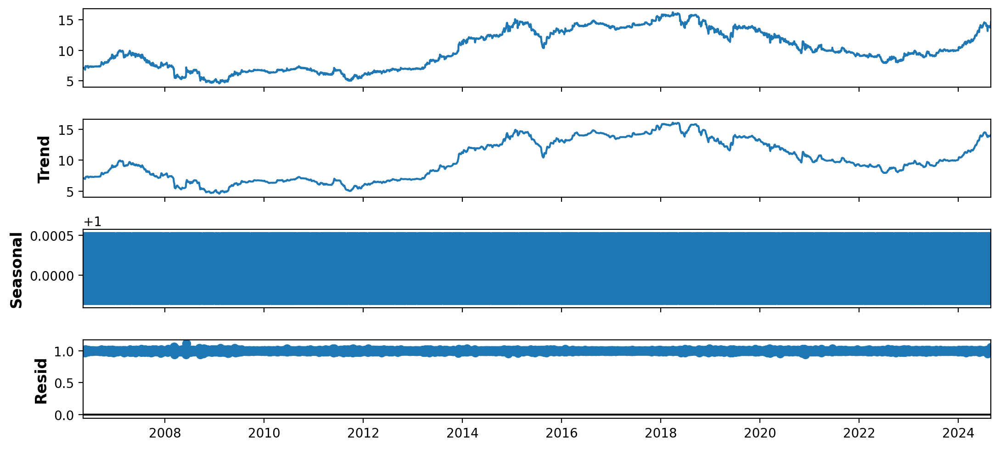

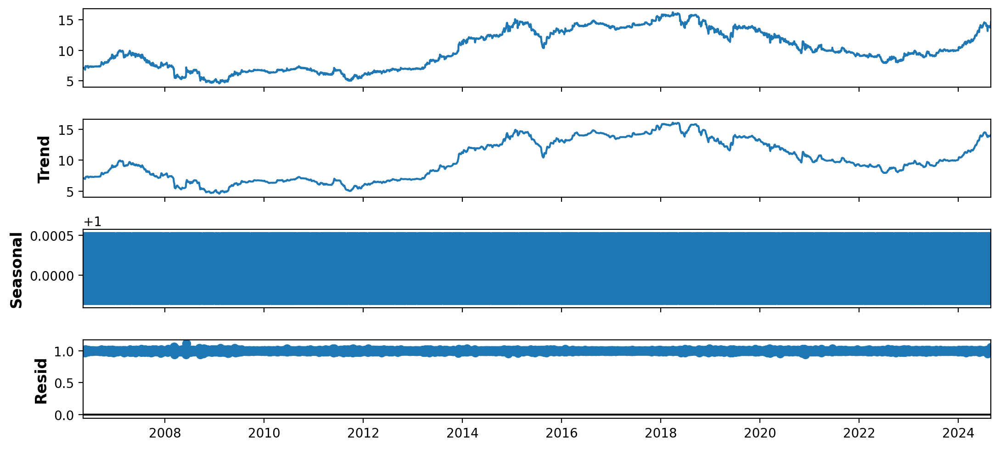

In [ ]:
result = seasonal_decompose(df.Close, model='multiplicative',period=5, extrapolate_trend = 5)
result.plot()

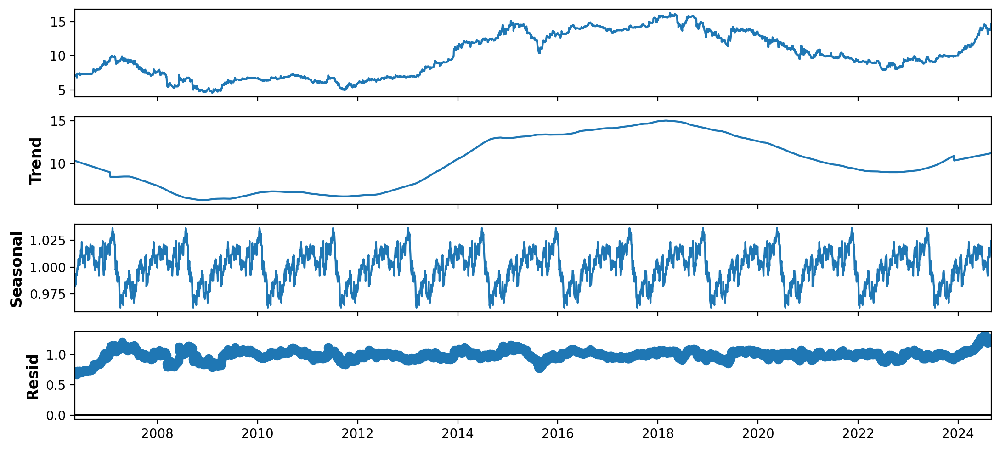

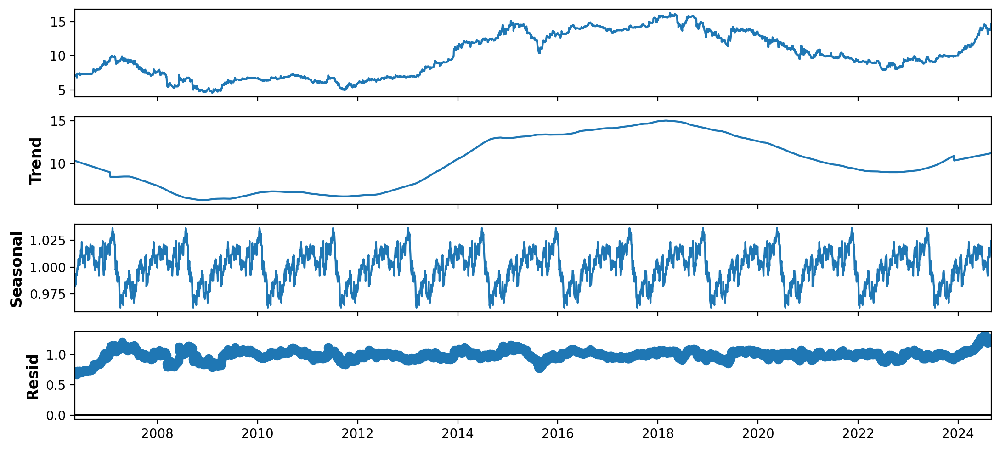

In [ ]:
result = seasonal_decompose(df.Close, model='multiplicative',period=365, extrapolate_trend = 365)
result.plot()

In [ ]:
import numpy as np

In [ ]:
df['yield'] = (df['Close'] - df['Close'].shift(1)) / df['Close'].shift(1)
df['log_yield'] = np.log(df['Close'] / df['Close'].shift(1))

In [ ]:
df = df.dropna()

<Axes: title={'center': 'Periodogram'}, ylabel='Variance'>

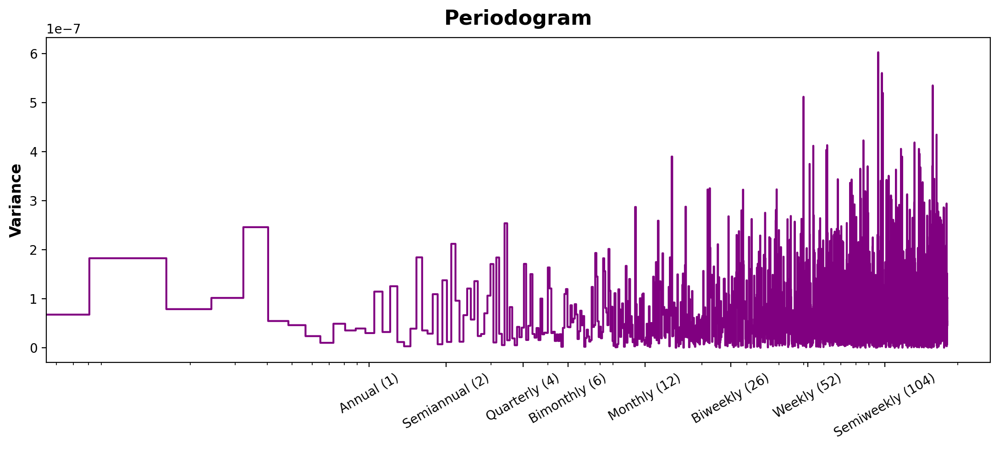

In [ ]:
close_values = df['log_yield'].values.flatten()  # Convert to 1D numpy array

# Plot the periodogram
plot_periodogram(close_values)

In [ ]:
df

Price,Adj Close,Close,High,Low,Open,Volume,yield,log_yield
Ticker,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,,
Date,,,,,,,,
2006-05-10,3.907241,7.12,7.16,7.04,7.04,12820,0.011364,0.011300
2006-05-11,3.885289,7.08,7.12,7.04,7.12,6263,-0.005618,-0.005634
2006-05-12,3.885289,7.08,7.08,7.08,7.08,0,0.000000,0.000000
2006-05-15,3.885289,7.08,7.08,6.96,7.04,3625,0.000000,0.000000
2006-05-16,3.863339,7.04,7.12,7.00,7.04,6492,-0.005650,-0.005666
...,...,...,...,...,...,...,...,...
2024-08-26,13.686756,13.92,14.00,13.76,13.76,5585600,0.014577,0.014472
2024-08-27,13.686756,13.92,14.00,13.84,13.84,4614600,0.000000,0.000000


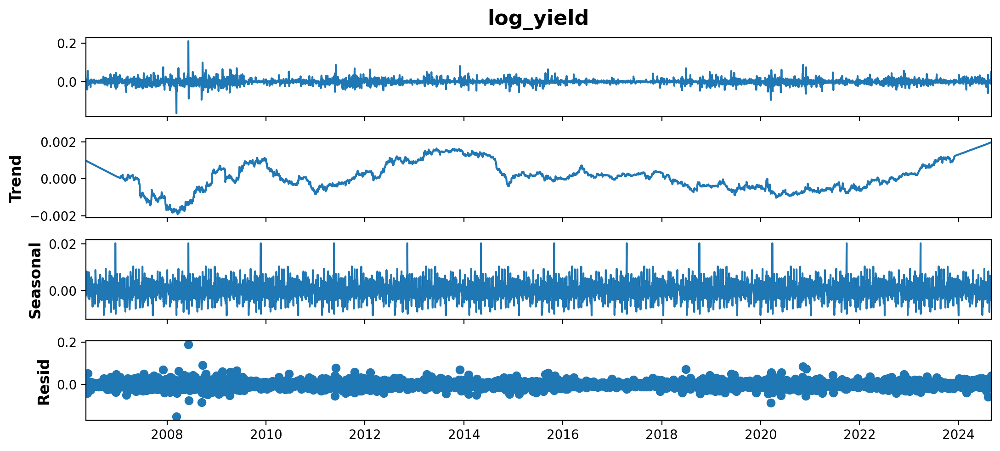

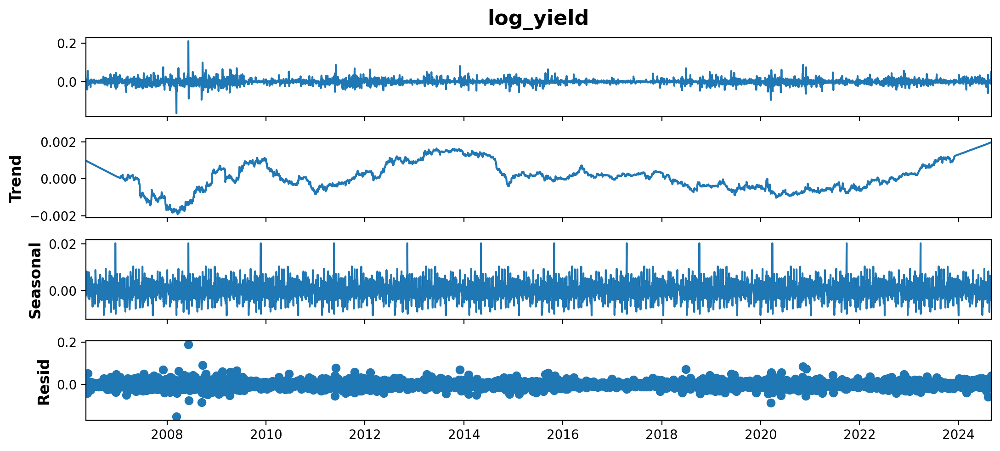

In [ ]:
result = seasonal_decompose(df.log_yield, model='additive',period=365, extrapolate_trend = 365)
result.plot()

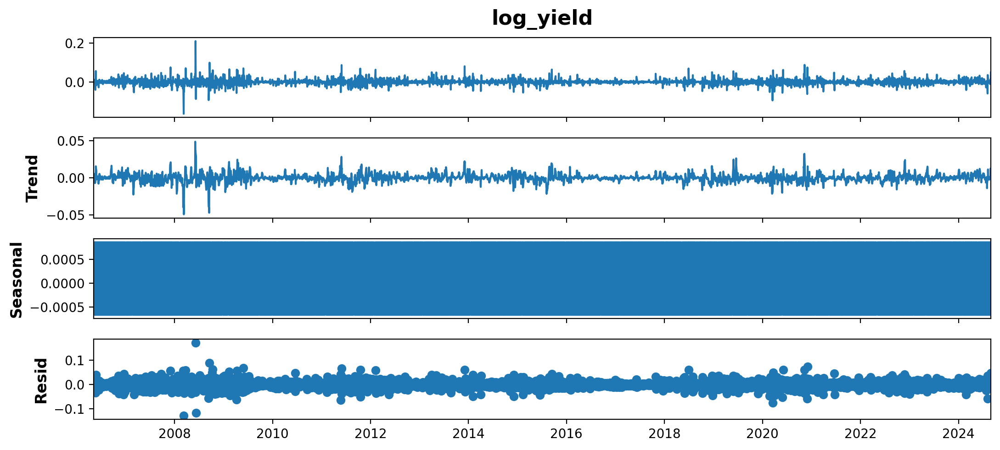

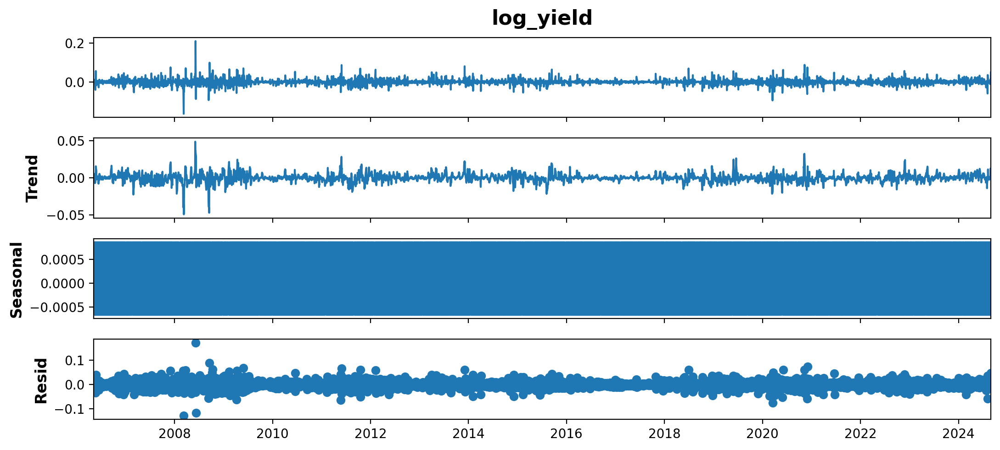

In [ ]:
result = seasonal_decompose(df.log_yield, model='additive',period=5, extrapolate_trend = 5)
result.plot()

Augmented Dickey Fuller

H0 : La série chronologique a une racine unitaire, ce qui signifie elle est non stationnaire, Elle a une certaine structure dépendante du temps

H1 : série temporelle n'a pas de racine unitaire, => stationnaire, elle n'a pas de structure dépendante du temps

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(x = df.Close)
print('ADF Statistic : ', round(result[0], 3), '\n')    # Plus cette statistique est négative, plus il est probable que notre data soit stationnaires.
print('p-value : ', round(result[1], 3), '  p-value > 0.05 : the data is non-stationary', '\n')
print('Critical Values : ')
for (key, value) in result[4].items() :
  print('For a Significance Level less than %s : %.3f' % (key, value))

ADF Statistic :  -0.986 

p-value :  0.758   p-value > 0.05 : the data is non-stationary 

Critical Values : 
For a Significance Level less than 1% : -3.432
For a Significance Level less than 5% : -2.862
For a Significance Level less than 10% : -2.567


p-value>0.05 : ne pas rejeter h0 , les données ont une racine unitaire et sont non-stationnaire

In [ ]:
df

Price,Adj Close,Close,High,Low,Open,Volume,yield,log_yield
Ticker,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,,
Date,,,,,,,,
2006-05-10,3.907241,7.12,7.16,7.04,7.04,12820,0.011364,0.011300
2006-05-11,3.885289,7.08,7.12,7.04,7.12,6263,-0.005618,-0.005634
2006-05-12,3.885289,7.08,7.08,7.08,7.08,0,0.000000,0.000000
2006-05-15,3.885289,7.08,7.08,6.96,7.04,3625,0.000000,0.000000
2006-05-16,3.863339,7.04,7.12,7.00,7.04,6492,-0.005650,-0.005666
...,...,...,...,...,...,...,...,...
2024-08-26,13.686756,13.92,14.00,13.76,13.76,5585600,0.014577,0.014472
2024-08-27,13.686756,13.92,14.00,13.84,13.84,4614600,0.000000,0.000000


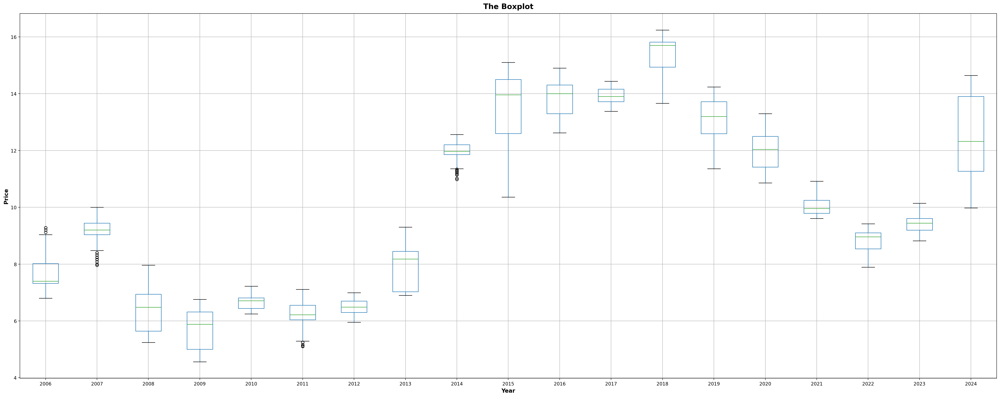

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Initialize an empty DataFrame to store grouped data
data = pd.DataFrame()

# Group 'Close' by year-end frequency
groups = df['Close'].groupby(pd.Grouper(freq='YE'))

# Loop through the groups
for name, group in groups:
    data[name.year] = group.reset_index(drop=True)  # Reset index to ensure proper alignment

# Create a boxplot
fig, axs = plt.subplots(1, 1, figsize=(30, 12))
data.boxplot(ax=axs)

# Customize the plot
axs.set_xlabel('Year')
axs.set_ylabel('Price')
axs.set_title('The Boxplot')
plt.show()


In [ ]:
df

Price,Adj Close,Close,High,Low,Open,Volume,yield,log_yield
Ticker,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,5347.KL,,
Date,,,,,,,,
2006-05-10,3.907241,7.12,7.16,7.04,7.04,12820,0.011364,0.011300
2006-05-11,3.885289,7.08,7.12,7.04,7.12,6263,-0.005618,-0.005634
2006-05-12,3.885289,7.08,7.08,7.08,7.08,0,0.000000,0.000000
2006-05-15,3.885289,7.08,7.08,6.96,7.04,3625,0.000000,0.000000
2006-05-16,3.863339,7.04,7.12,7.00,7.04,6492,-0.005650,-0.005666
...,...,...,...,...,...,...,...,...
2024-08-26,13.686756,13.92,14.00,13.76,13.76,5585600,0.014577,0.014472
2024-08-27,13.686756,13.92,14.00,13.84,13.84,4614600,0.000000,0.000000


In [ ]:
plot = go.Scatter(x = df.index, y = df.log_yield, mode = "markers + lines", name = 'log_yield' + ' Value')

fig = go.Figure(data = plot)
fig.update_layout(height = 800, width = 1800, title_text = "Depicting log_yield evolution", xaxis_title = 'Days', yaxis_title = 'Value')
fig.show()

In [ ]:
# Augmented Dickey-Fuller test :
result_log = adfuller(df.log_yield)

print('ADF Statistic : ', round(result_log[0], 3), '\n')

print('p-value : ', round(result_log[1], 3), '  p-value < 0.05 : the data is stationary', '\n')

print('Critical Values : ')
for (key, value) in result_log[4].items() :
  print('For a Significance Level less than %s : %.3f' % (key, value))

ADF Statistic :  -49.738 

p-value :  0.0   p-value < 0.05 : the data is stationary 

Critical Values : 
For a Significance Level less than 1% : -3.432
For a Significance Level less than 5% : -2.862
For a Significance Level less than 10% : -2.567


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style = "white")
sns.set(style = "whitegrid", color_codes = True)

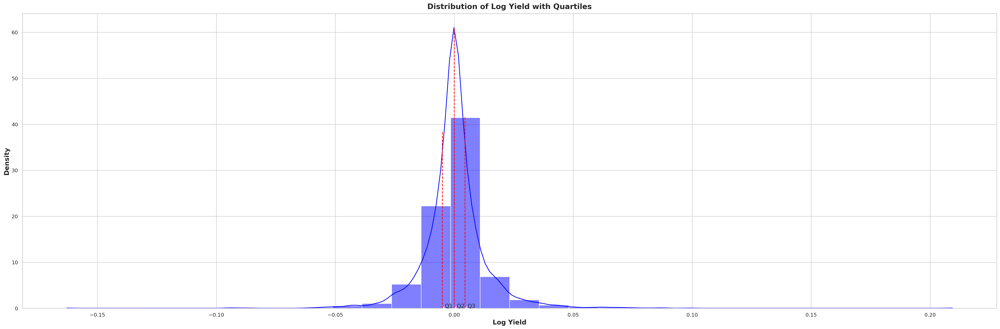


Mean:  0.00016183673015756367 

Variance:  0.00017949394072741594 

Skewness:  0.8271930103092507 

Kurtosis:  24.146842030746768 

Q1:  -0.005006295866699571
Q2:  0.0
Q3:  0.00452320458979701


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Quartiles
q1 = np.quantile(df.log_yield.dropna(), 0.25)  # Drop NaN to avoid errors
q2 = np.quantile(df.log_yield.dropna(), 0.50)
q3 = np.quantile(df.log_yield.dropna(), 0.75)

plt.figure(figsize=(30, 10))

# Plot histogram and density
sns.histplot(df.log_yield, kde=True, bins=30, color='blue', stat="density")

# 1st quartile (Q1)
plt.axvline(x=q1, ymin=0, ymax=0.6, color='red', linestyle='dashed')
plt.annotate('Q1', xy=(q1, 0.02), xytext=(q1 + 0.001, 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# 2nd quartile (Median or Q2)
plt.axvline(x=q2, ymin=0, ymax=0.95, color='red', linestyle='dashed')
plt.annotate('Q2', xy=(q2, 0.02), xytext=(q2 + 0.001, 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# 3rd quartile (Q3)
plt.axvline(x=q3, ymin=0, ymax=0.65, color='red', linestyle='dashed')
plt.annotate('Q3', xy=(q3, 0.02), xytext=(q3 + 0.001, 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# Add title and labels
plt.title('Distribution of Log Yield with Quartiles', fontsize=16)
plt.xlabel('Log Yield', fontsize=14)
plt.ylabel('Density', fontsize=14)

plt.show()

# Print statistical metrics
print('\nMean: ', df.log_yield.mean(), '\n')
print('Variance: ', df.log_yield.var(), '\n')
print('Skewness: ', df.log_yield.skew(), '\n')
print('Kurtosis: ', df.log_yield.kurtosis(), '\n')

# Print quartiles
print('Q1: ', q1)
print('Q2: ', q2)
print('Q3: ', q3)


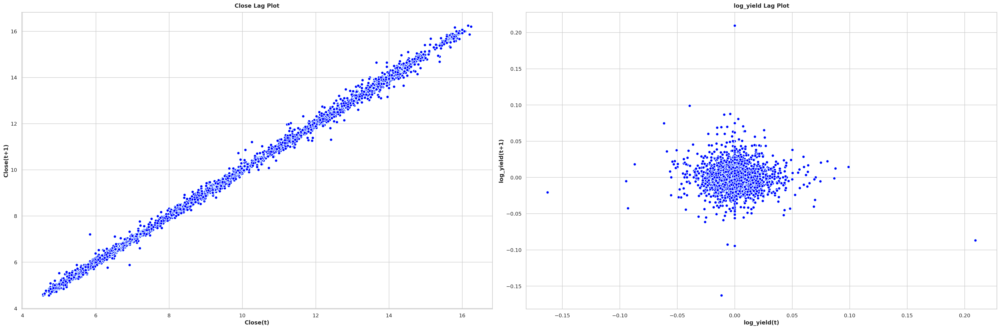

In [ ]:
from statsmodels.tsa.stattools import acovf, acf, pacf, pacf_yw, pacf_ols
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import lag_plot

# Lag plot :
fig, [ax1, ax2] = plt.subplots(1, 2, figsize = (30, 10))

ax1.set_title('Close Lag Plot')
lag_plot(series = df.Close, ax = ax1, c = 'blue', edgecolors = 'lightcyan')
ax1.set_xlabel('Close(t)')
ax1.set_ylabel('Close(t+1)')

ax2.set_title('log_yield Lag Plot')
lag_plot(series = df.log_yield, ax = ax2, c = 'blue', edgecolors = 'lightcyan')
ax2.set_xlabel('log_yield(t)')
ax2.set_ylabel('log_yield(t+1)')

plt.show()

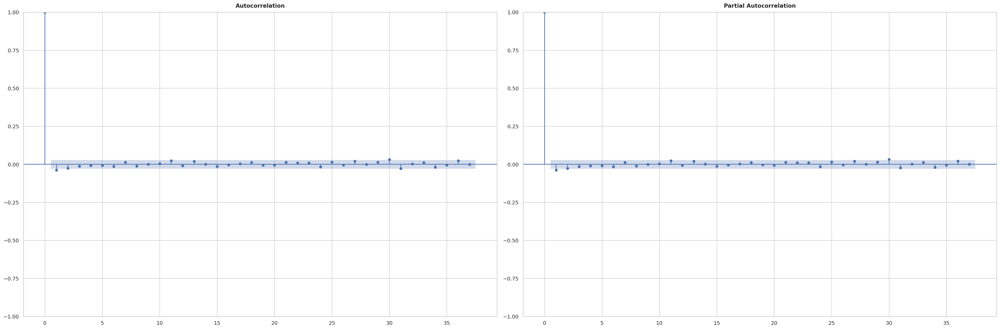


Autocorrelation coefficients :  [ 1.00000000e+00 -3.84652068e-02 -2.61481765e-02 -1.27740650e-02
 -8.43097148e-03 -7.67129538e-03 -1.43912186e-02  1.39054541e-02
 -1.19921025e-02 -2.56400106e-04  4.55847034e-03  2.29600043e-02
 -9.51163976e-03  1.85369535e-02  3.18399342e-04 -1.45147945e-02
 -4.50327592e-03  3.12655805e-03  1.23805117e-02 -6.73214369e-03
 -5.16002241e-03  1.35393323e-02  8.98329230e-03  9.04736091e-03
 -1.70661715e-02  1.43847631e-02 -5.70698693e-03  1.96212194e-02
 -1.35725759e-03  1.35015227e-02  3.06468136e-02 -2.79454664e-02
  2.62430707e-03  1.06696166e-02 -2.00140956e-02 -5.02693331e-03
  2.28128791e-02 -1.11203593e-03  3.53605723e-03 -1.07360386e-02
  1.79243229e-02]


In [ ]:
# Autocorrolation :
fig, axs = plt.subplots(1, 2, figsize = (30, 10))

plot_acf(x = df.log_yield, ax = axs[0])
plot_pacf(x = df.log_yield, ax = axs[1])

plt.show()

auto_coeffs = acf(x = df.log_yield, nlags = 40, fft = False)
print('\n''Autocorrelation coefficients : ', auto_coeffs)

In [ ]:
from scipy import stats

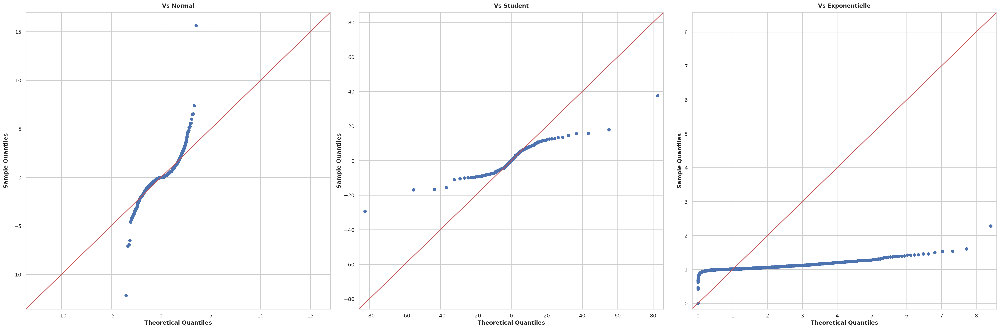

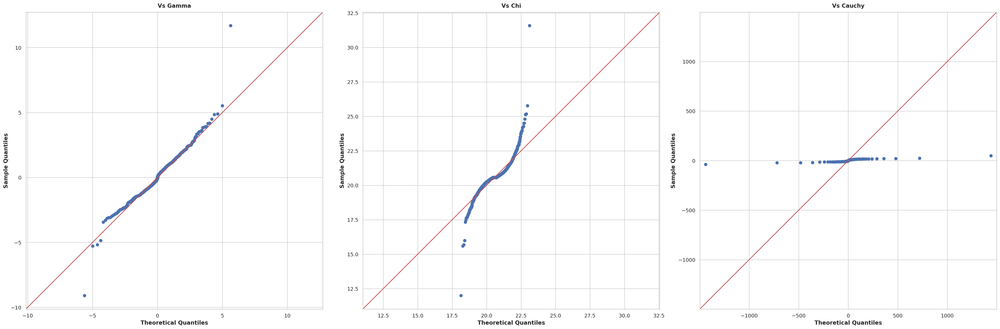

In [ ]:
from statsmodels.graphics.gofplots import qqplot

fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize = (30, 10))
fig, [ax4,ax5,ax6] = plt.subplots(1, 3, figsize = (30, 10))
ax1.set_title('Vs Normal')
qqplot(data = df.log_yield, dist = stats.norm, fit = True, line = '45', ax = ax1, c = 'blue')

ax2.set_title('Vs Student')
qqplot(data = df.log_yield, dist = stats.t, fit = True, line = '45', ax = ax2, c = 'blue')

ax3.set_title('Vs Exponentielle')
qqplot(data = df.log_yield, dist = stats.expon, fit = True, line = '45', ax = ax3, c = 'blue')

ax4.set_title('Vs Gamma')
qqplot(data = df.log_yield, dist = stats.dgamma, fit = True, line = '45', ax = ax4, c = 'blue')

ax5.set_title('Vs Chi')
qqplot(data = df.log_yield, dist = stats.chi, fit = True, line = '45', ax = ax5, c = 'blue')

ax6.set_title('Vs Cauchy')
qqplot(data = df.log_yield, dist = stats.cauchy, fit = True, line = '45', ax = ax6, c = 'blue')

plt.show()

In [ ]:
import warnings
warnings.filterwarnings("ignore")

stat, p_value = stats.shapiro(df.log_yield)

print('Shapiro-Wilk Statistic : ', round(stat, 3), '\n')
print('p-value : ', round(p_value, 3), '  p-value < 0.05 : the data is not normal', '\n')

Shapiro-Wilk Statistic :  0.841 

p-value :  0.0   p-value < 0.05 : the data is not normal 



Lissage Expo

In [ ]:
def Moving_Average_Describe(series, window, x_axis, plot_last, plot_CIs=False, Z_value=1.96):
    # Calculate rolling mean
    series = series.squeeze()
    rolling_mean = series.rolling(window=window).mean()

    # Initialize bounds
    lower_bound = None
    upper_bound = None

    # Plot confidence intervals for smoothed values
    if plot_CIs:
        mae = np.mean(np.abs(series[window:] - rolling_mean[window:]))  # Mean Absolute Error
        deviation = np.std(series[window:] - rolling_mean[window:])

        lower_bound = rolling_mean - (mae + Z_value * deviation)
        upper_bound = rolling_mean + (mae + Z_value * deviation)

    # Plotting
    plt.figure(figsize=(18, 8))

    # Plot original data
    plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

    # Plot rolling mean
    plt.plot(x_axis[-plot_last:], rolling_mean[-plot_last:], label='Rolling Mean Trend', color='orange', marker='o', linestyle='-', linewidth=2)

    # Plot confidence intervals
    if plot_CIs:
        plt.fill_between(x_axis[-plot_last:],
                         lower_bound[-plot_last:],
                         upper_bound[-plot_last:],
                         color='red', alpha=0.2, label='Confidence Interval (95%)')

    # Customize plot
    plt.title(f"Moving Average Depiction - Window Size: {window}", fontsize=16)
    plt.xlabel('Days', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Show plot
    plt.show()


In [ ]:
df.Close

Ticker,5347.KL
Date,
2006-05-10,7.12
2006-05-11,7.08
2006-05-12,7.08
2006-05-15,7.08
2006-05-16,7.04
...,...
2024-08-26,13.92
2024-08-27,13.92
2024-08-28,14.00


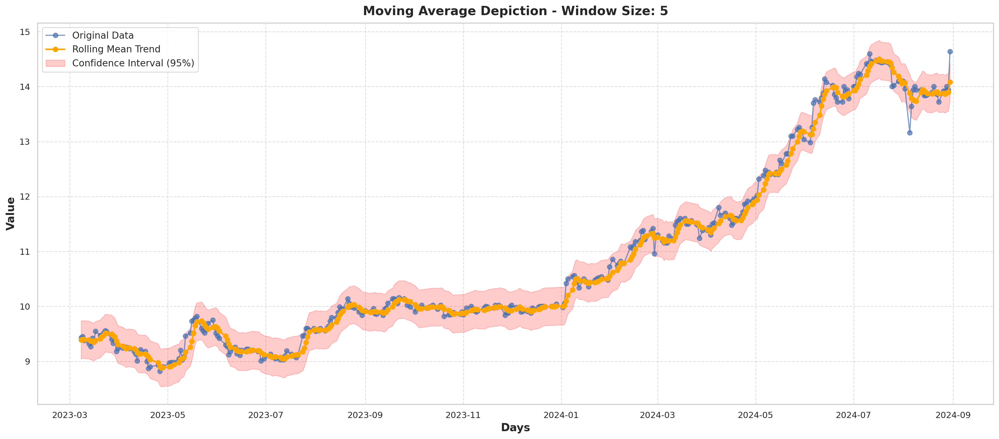

In [ ]:
Moving_Average_Describe(series = df.Close, window = 5, x_axis = df.index, plot_last = 365, plot_CIs = True)

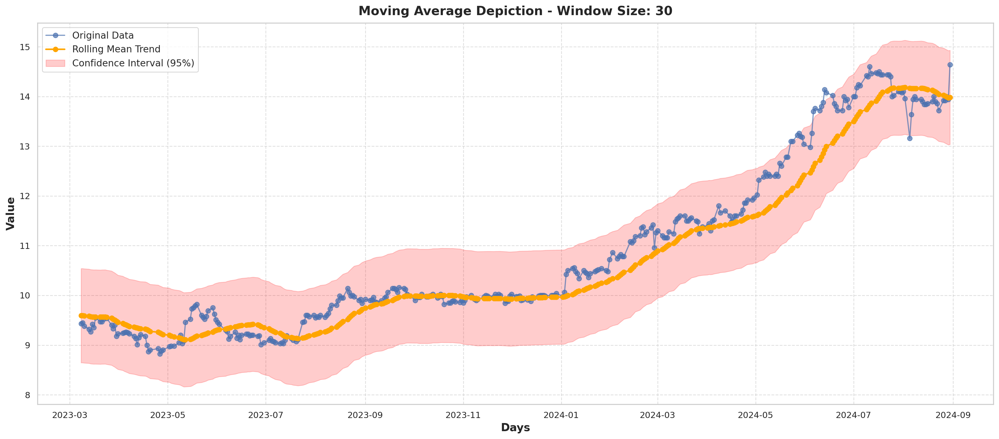

In [ ]:
Moving_Average_Describe(series = df.Close, window = 30, x_axis = df.index, plot_last = 365, plot_CIs = True)

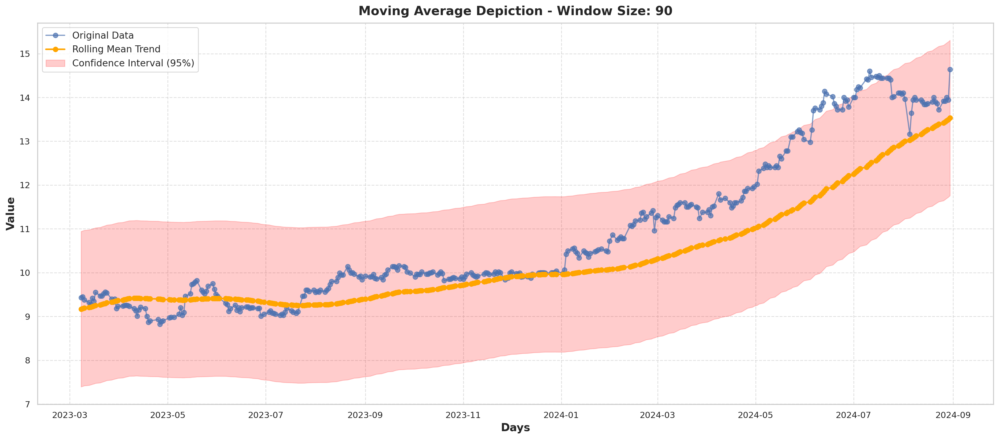

In [ ]:
Moving_Average_Describe(series = df.Close, window = 90, x_axis = df.index, plot_last = 365, plot_CIs = True)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Moving_Average_Forecast(series, n_test, window, x_axis, plot_last):
    # Prepare train and test sets
    series = series.squeeze()
    history = [obs for obs in series[:len(series) - n_test]]

    train_set = history[window:]
    test_set = [obs for obs in series[len(series) - n_test:]]

    rolling_means_history = []
    forecasts = []

    # Forecast for train set
    for i in range(len(history)):
        rolling_means_history.append(np.mean(history[i: i + window]))

    # Forecast for test set
    for i in range(len(test_set)):
        if i < window:
            slide = history[len(history) - window + i:] + forecasts
            forecasts.append(np.mean(slide))
        else:
            forecasts.append(np.mean(forecasts[i - window: i]))

    # Plotting
    plt.figure(figsize=(18, 8))

    # Original data
    plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

    # Train forecast (rolling mean)
    plt.plot(x_axis[len(series) - plot_last:], rolling_means_history[-plot_last:], label='Rolling Mean', color='orange', linestyle='-', linewidth=2)

    # Test forecast
    plt.plot(x_axis[len(series) - n_test:], forecasts, label=f'Forecasting Last {n_test}', color='green', linestyle='--', linewidth=2)

    # Customize plot
    plt.title(f"Moving Average Forecast - Window Size: {window}", fontsize=16)
    plt.xlabel('Days', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Show plot
    plt.show()

    # Computing RMSE
    rmse_test = np.sqrt(np.mean((np.array(test_set) - np.array(forecasts)) ** 2))
    print('\nRMSE - Test: ', round(rmse_test, 3))


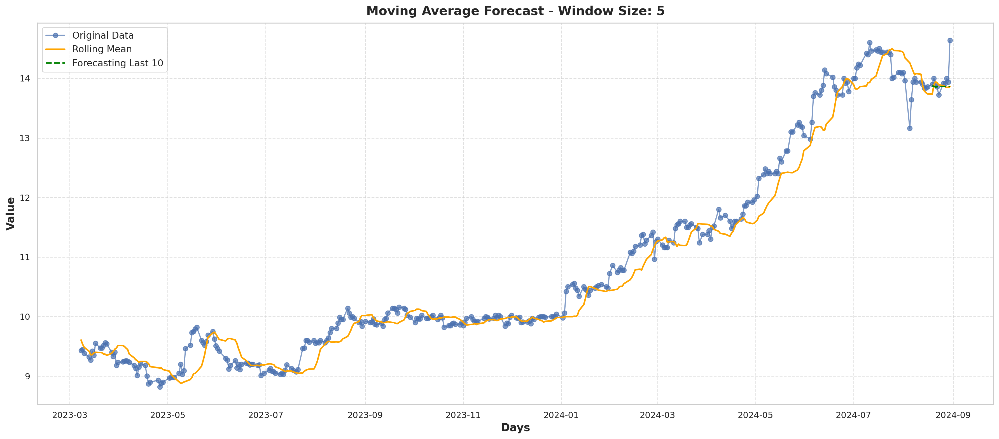


RMSE - Test:  0.261


In [ ]:
Moving_Average_Forecast(series = df.Close, n_test = 10, window = 5, x_axis = df.index, plot_last = 365)

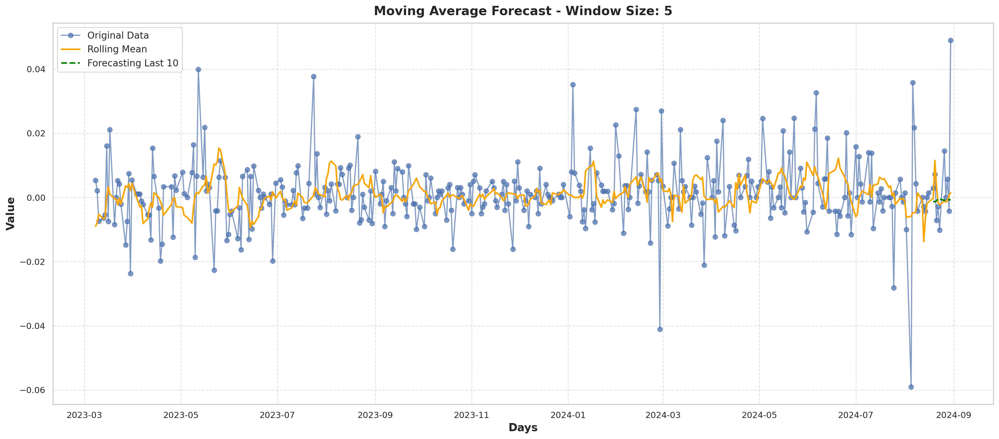


RMSE - Test:  0.017


In [ ]:
Moving_Average_Forecast(series = df.log_yield, n_test = 10, window = 5, x_axis = df.index, plot_last = 365)

In [ ]:
def Simple_Exp_Smoothing_Describe(series, alpha):
    result = [series[0]]  # First value is the same as the series

    for t in range(1, len(series)):
        result.append(alpha * series[t] + (1 - alpha) * result[t - 1])

    return result

def Plot_Simple_Exp_Smoothing_Describe(series, alphas, x_axis, plot_last):
    series = series.squeeze()

    # Plot original data
    plt.figure(figsize=(18, 8))
    plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

    # Plot smoothed data for each alpha
    for alpha in alphas:
        smoothed_series = Simple_Exp_Smoothing_Describe(series, alpha)
        plt.plot(x_axis[-plot_last:], smoothed_series[-plot_last:], label=f'Alpha = {alpha}', linestyle='--', linewidth=2)

        # Compute RMSE
        rmse = np.sqrt(np.mean((np.array(series[-plot_last:]) - np.array(smoothed_series[-plot_last:])) ** 2))
        print(f'\nRMSE - Alpha = {alpha}: {rmse:.3f}')

    # Customize plot
    plt.title("Simple Exponential Smoothing", fontsize=16)
    plt.xlabel('Days', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Show plot
    plt.show()



RMSE - Alpha = 0.05: 0.412

RMSE - Alpha = 0.1: 0.250

RMSE - Alpha = 0.3: 0.110

RMSE - Alpha = 0.7: 0.037


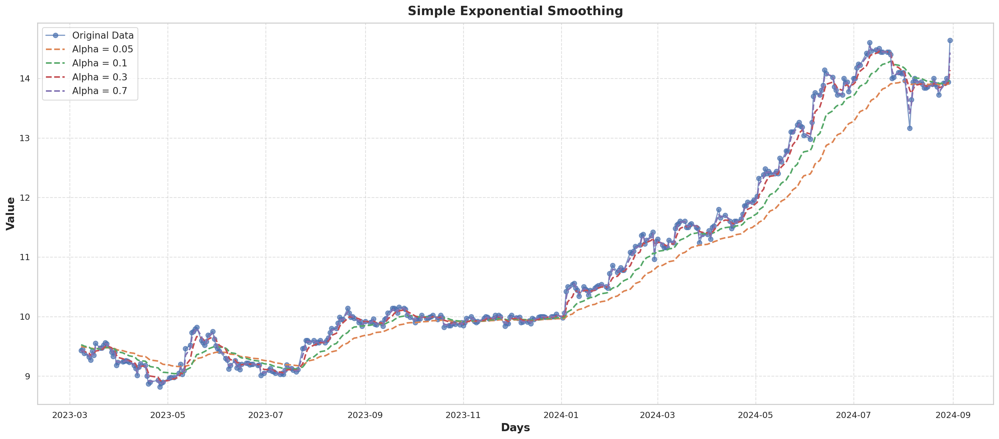

In [ ]:
Plot_Simple_Exp_Smoothing_Describe(series = df.Close, alphas = [0.05, 0.1, 0.3, 0.7], x_axis = df.index, plot_last = 365)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Simple_Exp_Smoothing_Forecast(series, n_test, alpha, x_axis, plot_last, if_plot=True):
    series = series.squeeze()

    # Split data into train and test sets
    train_set = [obs for obs in series[:len(series) - n_test]]
    test_set = [obs for obs in series[len(series) - n_test:]]

    train_forecast = [train_set[0]]  # First value is the same as the series
    test_forecast = []

    # Train forecast
    for t in range(1, len(train_set)):
        train_forecast.append(alpha * train_set[t] + (1 - alpha) * train_forecast[t - 1])

    # Forecast for test set
    for t in range(len(test_set)):
        if t == 0:
            pred = alpha * train_set[-1] + (1 - alpha) * train_forecast[-1]
            test_forecast.append(pred)
        else:
            pred = alpha * train_set[-1] + (1 - alpha) * test_forecast[t - 1]
            test_forecast.append(pred)

    # Compute RMSE
    rmse_forecast = np.sqrt(np.mean((np.array(test_set) - np.array(test_forecast)) ** 2))

    if if_plot:
        # Plot original data
        plt.figure(figsize=(18, 8))
        plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

        # Plot smoothed train set
        plt.plot(x_axis[len(series) - plot_last:], train_forecast[-plot_last:], label='Smooth Train', color='orange', linestyle='--', linewidth=2)

        # Plot test forecast
        plt.plot(x_axis[len(series) - n_test:], test_forecast, label='Forecasts', color='green', linestyle='-', linewidth=2)

        # Customize plot
        plt.title(f"Simple Exponential Smoothing Forecast - Alpha = {alpha}", fontsize=16)
        plt.xlabel('Days', fontsize=14)
        plt.ylabel('Value', fontsize=14)
        plt.legend(fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.6)

        # Show plot
        plt.show()

        print(f'\nRMSE Forecast - Alpha = {alpha}: {rmse_forecast:.3f}')

    else:
        return rmse_forecast


In [ ]:
# Optimizing alpha :

alpha_range = []
rmse_range = []

for i in range(1, 100) :
  alpha_range.append(i * 0.01)

for alpha in alpha_range :
  rmse_range.append((alpha, Simple_Exp_Smoothing_Forecast(series = df.Close, n_test = 10, alpha = alpha, x_axis = df.index, plot_last = 365, if_plot = False)))

SES_alpha_rmse = pd.DataFrame(data = rmse_range, columns = ['Alpha', 'RMSE'])
best_alpha = float(SES_alpha_rmse[SES_alpha_rmse.RMSE == min(SES_alpha_rmse.RMSE)]['Alpha'])

print('The best value of alpha :')
SES_alpha_rmse[SES_alpha_rmse.RMSE == min(SES_alpha_rmse.RMSE)]

The best value of alpha :


,Alpha,RMSE
6,0.07,0.244984


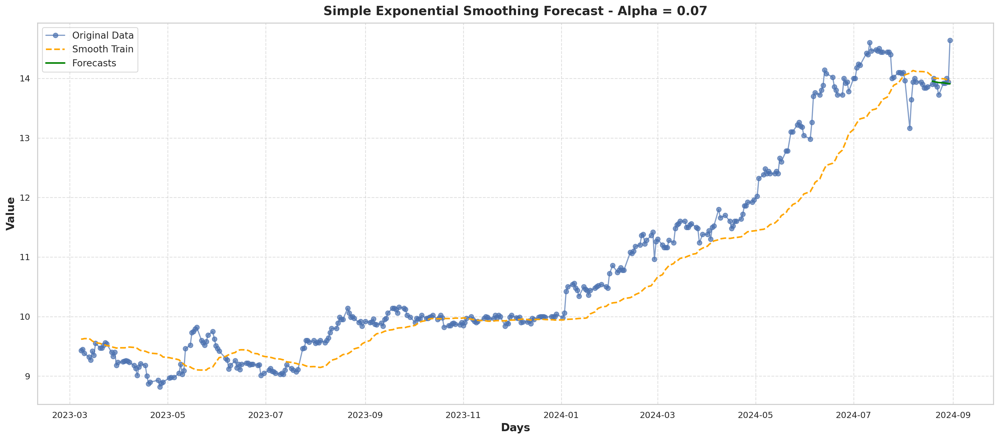


RMSE Forecast - Alpha = 0.07: 0.245


In [ ]:
Simple_Exp_Smoothing_Forecast(series = df.Close, n_test = 10, alpha = best_alpha, x_axis = df.index, plot_last = 365)

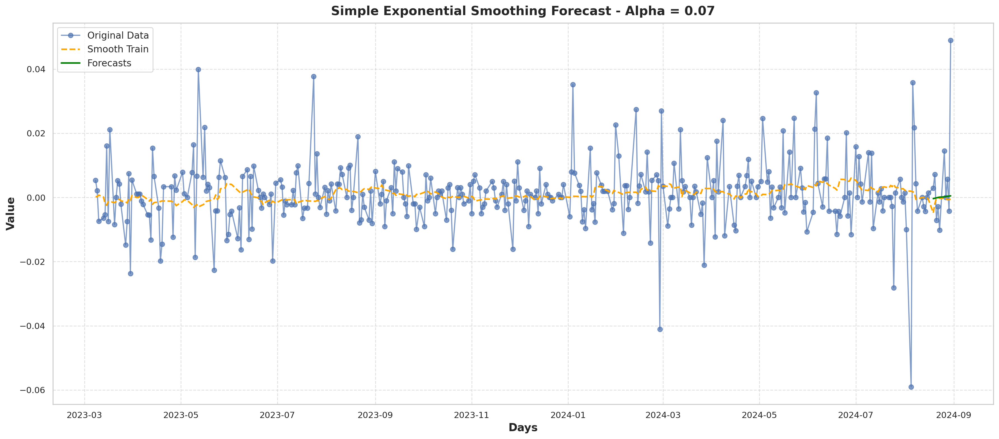


RMSE Forecast - Alpha = 0.07: 0.017


In [ ]:
Simple_Exp_Smoothing_Forecast(series = df.log_yield, n_test = 10, alpha = best_alpha, x_axis = df.index, plot_last = 365)

In [ ]:
# Optimizing alpha :

alpha_range = []
rmse_range = []

for i in range(1, 100) :
  alpha_range.append(i * 0.01)

for alpha in alpha_range :
  rmse_range.append((alpha, Simple_Exp_Smoothing_Forecast(series = df.log_yield, n_test = 10, alpha = alpha, x_axis = df.index, plot_last = 365, if_plot = False)))

SES_alpha_rmse = pd.DataFrame(data = rmse_range, columns = ['Alpha', 'RMSE'])
best_alpha = float(SES_alpha_rmse[SES_alpha_rmse.RMSE == min(SES_alpha_rmse.RMSE)]['Alpha'])

print('The best value of alpha :')
SES_alpha_rmse[SES_alpha_rmse.RMSE == min(SES_alpha_rmse.RMSE)]

The best value of alpha :


,Alpha,RMSE
98,0.99,0.016572


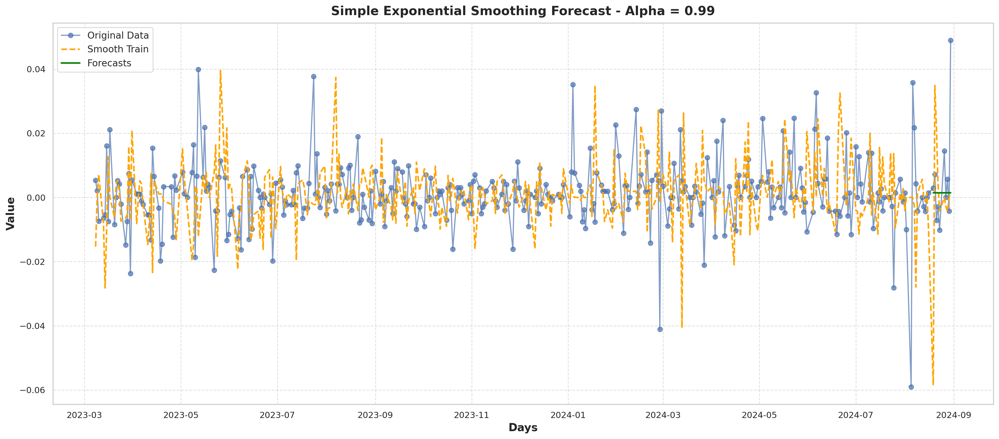


RMSE Forecast - Alpha = 0.99: 0.017


In [ ]:
Simple_Exp_Smoothing_Forecast(series = df.log_yield, n_test = 10, alpha = best_alpha, x_axis = df.index, plot_last = 365)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Double_Exponential_Smoothing_Describe(series, alpha, beta):
    result = [series[0]]

    for t in range(1, len(series)):
        if t == 1:
            S, b = series[0], series[1] - series[0]  # Initialization
        else:
            S_1 = S
            S = alpha * series[t] + (1 - alpha) * (S + b)
            b = beta * (S - S_1) + (1 - beta) * b

        result.append(S + b)
    return result

def Plot_Double_Exp_Smoothing_Describe(series, alphas, betas, x_axis, plot_last):
    series = series.squeeze()

    # Plot original data
    plt.figure(figsize=(18, 8))
    plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

    # Plot smoothed data for each (alpha, beta) pair
    for (alpha, beta) in zip(alphas, betas):
        smoothed_series = Double_Exponential_Smoothing_Describe(series, alpha, beta)
        plt.plot(x_axis[-plot_last:], smoothed_series[-plot_last:], label=f'(Alpha, Beta) = ({alpha}, {beta})', linestyle='--', linewidth=2)

        # Compute RMSE
        rmse = np.sqrt(np.mean((np.array(series[-plot_last:]) - np.array(smoothed_series[-plot_last:])) ** 2))
        print(f'\nRMSE - (Alpha, Beta) = ({alpha}, {beta}): {rmse:.3f}')

    # Customize plot
    plt.title("Double Exponential Smoothing", fontsize=16)
    plt.xlabel('Days', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)

    # Show plot
    plt.show()


RMSE - (Alpha, Beta) = (0.1, 0.4): 0.209

RMSE - (Alpha, Beta) = (0.3, 0.5): 0.109

RMSE - (Alpha, Beta) = (0.7, 0.7): 0.065


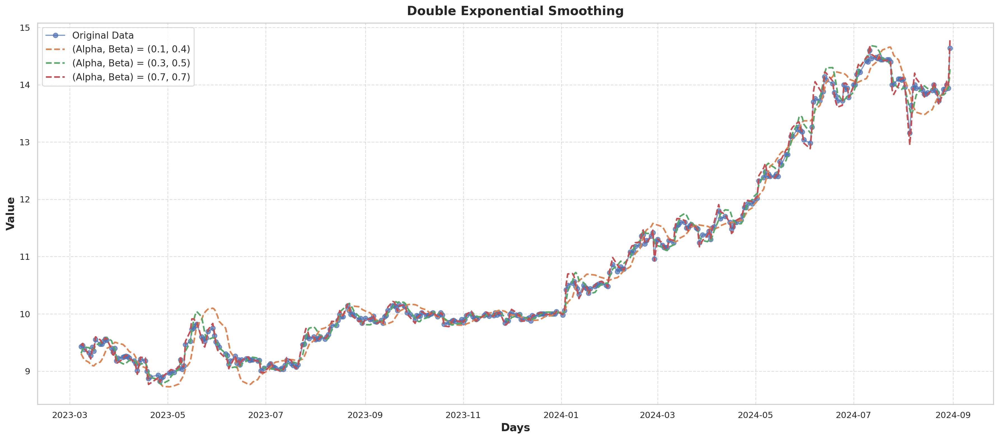

In [ ]:
Plot_Double_Exp_Smoothing_Describe(series = df.Close, alphas = [0.1, 0.3, 0.7], betas = [0.4, 0.5, 0.7], x_axis = df.index, plot_last = 365)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def Double_Exp_Smoothing_Forecast(series, n_test, alpha, beta, x_axis, plot_last, if_plot=True):
    series = series.squeeze()

    # Split data into train and test sets
    train_set = [obs for obs in series[:len(series) - n_test]]
    test_set = [obs for obs in series[len(series) - n_test:]]

    train_forecast = [train_set[0]]  # First value is the same as the series
    test_forecast = []

    # Train smoothing
    for t in range(1, len(train_set)):
        if t == 1:
            S, b = train_set[0], train_set[1] - train_set[0]  # Initialization
        else:
            S_1 = S
            S = alpha * train_set[t] + (1 - alpha) * (S + b)
            b = beta * (S - S_1) + (1 - beta) * b

        train_forecast.append(S + b)

    # Test forecasting
    for m in range(1, len(test_set) + 1):
        F = S + m * b  # Perform the forecast
        test_forecast.append(F)

    # Compute RMSE
    rmse_forecast = np.sqrt(np.mean((np.array(test_set) - np.array(test_forecast)) ** 2))

    if if_plot:
        # Plot original data
        plt.figure(figsize=(18, 8))
        plt.plot(x_axis[-plot_last:], series[-plot_last:], label='Original Data', marker='o', linestyle='-', alpha=0.7)

        # Plot smoothed train set
        plt.plot(x_axis[len(series) - plot_last:], train_forecast[-plot_last:], label='Smooth Train', color='orange', linestyle='--', linewidth=2)

        # Plot test forecast
        plt.plot(x_axis[len(series) - n_test:], test_forecast, label='Forecasts', color='green', linestyle='-', linewidth=2)

        # Customize plot
        plt.title(f"Double Exponential Smoothing Forecast - (Alpha, Beta) = ({alpha}, {beta})", fontsize=16)
        plt.xlabel('Days', fontsize=14)
        plt.ylabel('Value', fontsize=14)
        plt.legend(fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.6)

        # Show plot
        plt.show()

        print(f'\nRMSE Forecast - (Alpha, Beta) = ({alpha}, {beta}): {rmse_forecast:.3f}')

    else:
        return rmse_forecast

In [ ]:
from itertools import product


In [ ]:
# Optimizing alpha and beta :

alpha_range = []
beta_range = []

rmse_range = []

for i in range(1, 100) :
  alpha_range.append(i * 0.01)
  beta_range.append(i * 0.01)

params_range = list(product(alpha_range, alpha_range))

for (alpha, beta) in params_range :
  rmse_range.append((alpha, beta, Double_Exp_Smoothing_Forecast(series = df.Close, n_test = 10, alpha = alpha, beta = beta, x_axis = df.index, plot_last = 365, if_plot = False)))

DES_alpha_beta_rmse = pd.DataFrame(data = rmse_range, columns = ['Alpha', 'Beta', 'RMSE'])
best_alpha = float(DES_alpha_beta_rmse[DES_alpha_beta_rmse.RMSE == min(DES_alpha_beta_rmse.RMSE)]['Alpha'])
best_beta = float(DES_alpha_beta_rmse[DES_alpha_beta_rmse.RMSE == min(DES_alpha_beta_rmse.RMSE)]['Beta'])

print('The best value of alpha and beta :')
DES_alpha_beta_rmse[DES_alpha_beta_rmse.RMSE == min(DES_alpha_beta_rmse.RMSE)]

The best value of alpha and beta :


,Alpha,Beta,RMSE
1426,0.15,0.41,0.196635


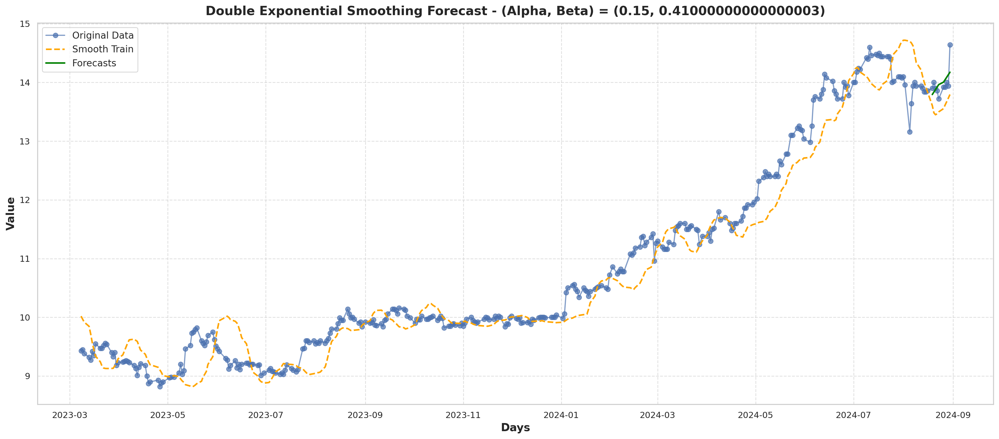


RMSE Forecast - (Alpha, Beta) = (0.15, 0.41000000000000003): 0.197


In [ ]:
Double_Exp_Smoothing_Forecast(series = df.Close, n_test = 10, alpha = best_alpha, beta = best_beta, x_axis = df.index, plot_last = 365)